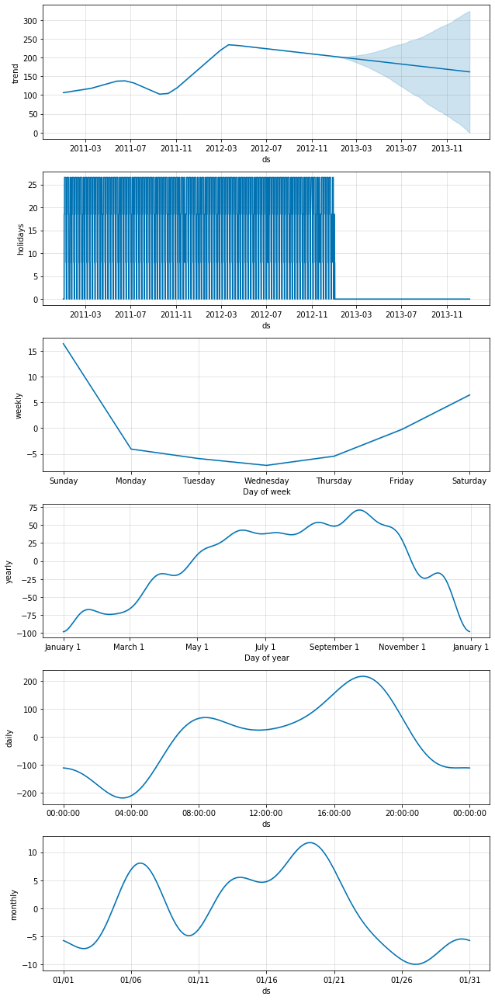

In [26]:
def PREDICTIVE_MODEL(fileLocation,pdays,frequency):
    import pandas as pd
    import plotly.offline as py
    from fbprophet import Prophet
    from fbprophet.plot import plot_plotly

    df=pd.read_csv(fileLocation)
    df['dteday'] = pd.to_datetime(df['dteday'])
    df['hourly'] = pd.to_datetime(df['dteday']) + (pd.to_timedelta(df['hr'], unit='h'))
    df1 = df[['hourly','cnt']]
    df1=df1.rename(columns={"hourly": "ds", "cnt": "y"})
    
    dff=df[df['workingday']>0]; dff=dff['hourly'];dff
    workingdays = pd.DataFrame({'holiday': 'workingday', 'ds': (dff),'lower_window': 0,'upper_window': 1,})
    model = Prophet(yearly_seasonality=True,daily_seasonality=True,holidays=workingdays)
    model.add_seasonality( name='monthly', period=30.5, fourier_order=5)
    model.fit(df1)
    
    future =model.make_future_dataframe(periods=pdays, freq=frequency)
    forecast =model.predict(future)
    
    py.init_notebook_mode()

    fig = plot_plotly(model, forecast)  # This returns a plotly Figure
    fig2=model.plot_components(forecast)
    return py.iplot(fig)#, fig2

PREDICTIVE_MODEL("hour.csv",8760,'H')